# 🐶 End-to-end Multi-class Dog Breed Classification

This notebook builds an end-to-end multi-class image classifier using TensorFlow and TensorFlow Hub.

## 1. Problem
Identifying the breed of a dog given an image of dog.

## 2. Data
The data we're using is from Kaggle's dog breed identification competition.
https://www.kaggle.com/competitions/dog-breed-identification/data

## 3. Evalutaion
The evaluation is a file with prediction probabilities for each dog breed of each test image.
https://www.kaggle.com/competitions/dog-breed-identification/overview/evaluation

## 4. Features

Some information about the data:
* We're dealing with images (unstructured data) so it's probably best we use deep learning.
* There are 120 breeds of dogs (this means there are 120 different classes).
* There are around 10,000+ in the training set (these images have labels)
* There are around 10,000+ in the test set (these images have no labels)


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
# Unzip the uploaded data into Google Drive
# !unzip "/content/drive/MyDrive/Dog Vision/dog-breed-identification.zip" -d "/content/drive/MyDrive/Dog Vision/"

## Get our workspace ready

In [ ]:
# Import TensorFlow
import tensorflow as tf
print("TF version: ",tf.__version__)

TF version:  2.12.0


In [ ]:
# Import TensorFlowHub
import tensorflow_hub as hub
print("TF Hub version: ",hub.__version__)


TF Hub version:  0.13.0


In [ ]:
# Check for GPU availability
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


## Getting our data ready (turning into Tensors)

With all machine learning models, our data has to be in numerical format. So that's that we'll be doing first. Turning our images into Tensors (numerical representations).

Let's start by accessing our data and checking out labels.

In [ ]:
# Checkout the labels of our data
import pandas as pd
labels_csv = pd.read_csv("drive/MyDrive/Dog Vision/labels.csv")
print(labels_csv.describe())
print(labels_csv.head())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126
                                 id             breed
0  000bec180eb18c7604dcecc8fe0dba07       boston_bull
1  001513dfcb2ffafc82cccf4d8bbaba97             dingo
2  001cdf01b096e06d78e9e5112d419397          pekinese
3  00214f311d5d2247d5dfe4fe24b2303d          bluetick
4  0021f9ceb3235effd7fcde7f7538ed62  golden_retriever


In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

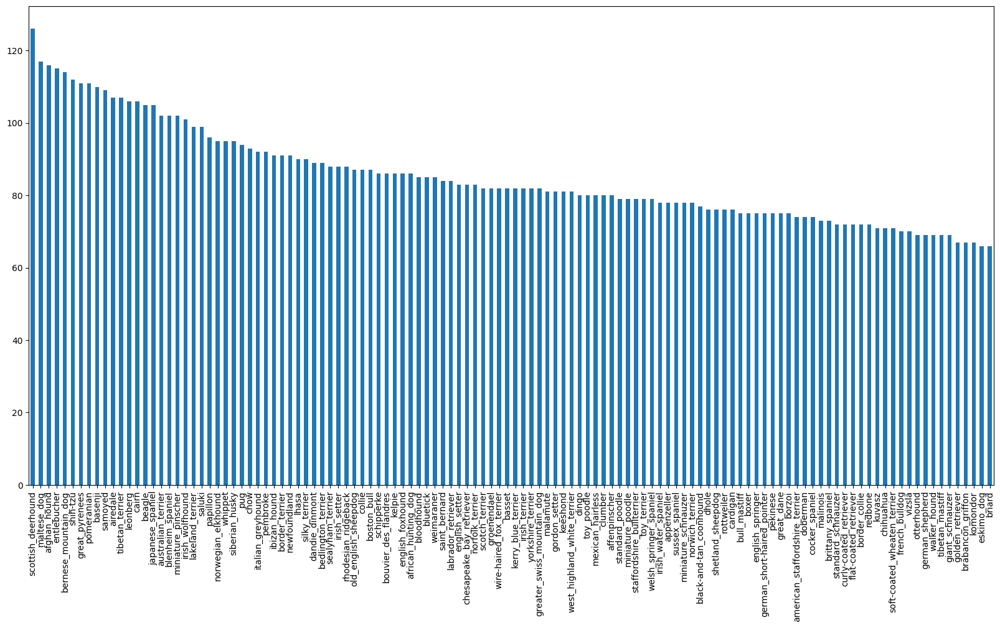

In [ ]:
# How many images are there for each breed?
labels_csv["breed"].value_counts().plot.bar(figsize=(20,10))

In [ ]:
labels_csv["breed"].value_counts().median()

82.0

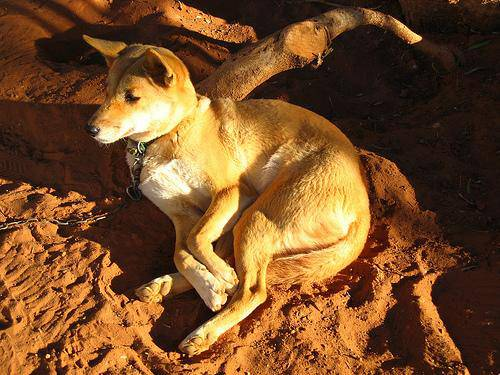

In [ ]:
# Let's view an image
from IPython.display import Image
Image("drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg")

### Getting images and their labels

Let's get a list all of our image file pathnames.

In [ ]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


In [ ]:
# Create pathnames from images ID's
filenames = ["drive/MyDrive/Dog Vision/train/" + fname + ".jpg" for fname in labels_csv["id"]]
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
# Check whether number of filnames matches number of actual image files
import os
if len(os.listdir("drive/MyDrive/Dog Vision/train/")) == len(filenames):
  print("Filenames match actual amount of files.")
else:
  print("Filenames do not match actual amount of files.")

Filenames match actual amount of files.


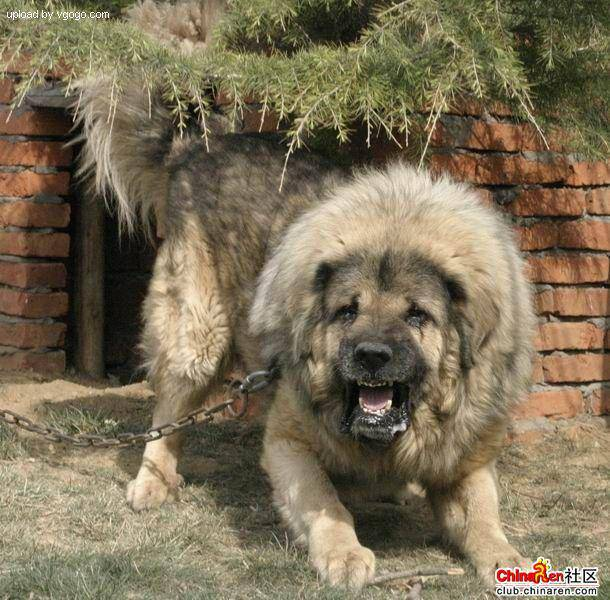

In [ ]:
# One more check
Image(filenames[9000])

In [ ]:
labels_csv["breed"][9000]

'tibetan_mastiff'

Since we've now got our training images filepaths in a list, let's prepare our labels.

In [ ]:
import numpy as np
labels = labels_csv["breed"].to_numpy()
# labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [ ]:
len(labels)

10222

In [ ]:
# See if number of labels matches the number of filenames
if len(labels) == len(filenames):
  print("Number of labels matches number of filesnames.")
else:
  print("Number of labels does not matches number of filesnames.")

Number of labels matches number of filesnames.


In [ ]:
# Finds the unique labels values
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [ ]:
unique_breeds

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
# Turn a single labels into an array of booleans
print(labels[0])
labels[0] == unique_breeds

boston_bull


array([False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False,  True, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False, False, False, False, False, False, False,
       False, False, False])

In [ ]:
# Turn every label into a boolean array
boolean_labels = [label == unique_breeds for label in labels]
boolean_labels

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
len(boolean_labels)

10222

In [ ]:
# Example: Turning boolean array into integers
print(labels[0])
print(np.where(unique_breeds == labels[0])) # index where labels occurs
print(boolean_labels[0].argmax()) #index where label occurs in boolean array
print(boolean_labels[0].astype(int)) # there will be 1 where the sample labels occurs

boston_bull
(array([19]),)
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
len([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1])

20

In [ ]:
filenames[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Creating our own validation set
Since the dataset from kaggle doesn't come with a validation set, we're going to create our own.

In [ ]:
# Setup X & y variables
X = filenames
y = boolean_labels

In [ ]:
len(X)

10222

We're going to start off experimenting with ~1000 images and increases as needed.

In [ ]:
# Set number of images to use for experimenting
NUM_IMAGES = 1000 #@param {type:"slider", min:1000, max:10000, step:1000}

In [ ]:
# Let's split our data into train and validation sets
from sklearn.model_selection import train_test_split

# Split them into training and validation of total size NUM_IMAGES

X_train, X_val, y_train, y_val = train_test_split(X[:NUM_IMAGES],
                                                  y[:NUM_IMAGES],
                                                  test_size = 0.2,
                                                  random_state=42)

len(X_train), len(y_train), len(X_val), len(y_val)

(800, 800, 200, 200)

In [ ]:
# Let's have a geez at the training data
X_train[:5], y_train[:2]

(['drive/MyDrive/Dog Vision/train/00bee065dcec471f26394855c5c2f3de.jpg',
  'drive/MyDrive/Dog Vision/train/0d2f9e12a2611d911d91a339074c8154.jpg',
  'drive/MyDrive/Dog Vision/train/1108e48ce3e2d7d7fb527ae6e40ab486.jpg',
  'drive/MyDrive/Dog Vision/train/0dc3196b4213a2733d7f4bdcd41699d3.jpg',
  'drive/MyDrive/Dog Vision/train/146fbfac6b5b1f0de83a5d0c1b473377.jpg'],
 [array([False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False,  True,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, False, False,
         False, False, False, False, False, False, False, 

## Preprocessing Images (Turning images into Tensors)

To preprocess our images into Tensors we're going to write a function which does a few things:
1. Take an image filepath as input
2. Use Tenserflow to read the file and save it to a variable, `image`
3. Turn our `image` (a jpg) into Tensors
4. Normalize our `image` (convery color channel values from 0-255 to 0-1).
5. Resize the `image` to be a shape of(224,224)
6. Return the modified `image`

In [ ]:
# Convert image to NumPy
from matplotlib.pyplot import imread
image = imread(filenames[42])
image.shape

(257, 350, 3)

In [ ]:
image.max(), image.min()

(255, 0)

In [ ]:
image[:2]

array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)

In [ ]:
# Turn image into tensors
tf.constant(image)[:2]

<tf.Tensor: shape=(2, 350, 3), dtype=uint8, numpy=
array([[[ 89, 137,  87],
        [ 76, 124,  74],
        [ 63, 111,  59],
        ...,
        [ 76, 134,  86],
        [ 76, 134,  86],
        [ 76, 134,  86]],

       [[ 72, 119,  73],
        [ 67, 114,  68],
        [ 63, 111,  63],
        ...,
        [ 75, 131,  84],
        [ 74, 132,  84],
        [ 74, 131,  86]]], dtype=uint8)>

In [ ]:
# Define image size
IMG_SIZE = 224

# Create a function for preprocessing images
def process_image(image_path, img_size=IMG_SIZE):
  """
  Takes an image file path and turns the image into a Tensor.
  """
  # Read in an image file
  image = tf.io.read_file(image_path)
  # Turn the jpeg image into numerical Tensor with 3 colour channels (Red, Green, Blue)
  image = tf.image.decode_jpeg(image,channels=3)
  # Convert the colour channel values from 0-255 to 0-1 values (normalization i.e. makes computation more efficicent)
  image = tf.image.convert_image_dtype(image,tf.float32)
  # Resize the image to our desired value(244,244)
  image = tf.image.resize(image, size = [img_size, img_size])

  return image

## Turning our data into batches

Why turn our data into batches ?

Let's say you're trying to process 10,000+ images in one go.... they all might not fit into memory.

So that's why we do about 32 (this is the batch size) images at a time (you can manually adjust the batch size if need be).

In order to use TensorFlow effectively, we need our data in the form of Tensor tuples which look like this:
`(image, label)`

In [ ]:
# Create a simple function to return a tuple (image,label)
def get_image_label(image_path, label):
  """
  Takes an image file path name and the associated label,
  processes the image and returns a tuple of (image, label)
  """
  image = process_image(image_path)
  return image,label

In [ ]:
# Demo of the above
(process_image(X[26]), tf.constant(y[42]))

(<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[0.25410587, 0.2894    , 0.2776353 ],
         [0.29784313, 0.33313724, 0.32137254],
         [0.29804096, 0.33333507, 0.32157037],
         ...,
         [0.41461015, 0.46559054, 0.38715917],
         [0.44833592, 0.4993163 , 0.42088494],
         [0.44921985, 0.5002003 , 0.42176887]],
 
        [[0.27608263, 0.31137675, 0.29961205],
         [0.30547515, 0.34076926, 0.32900456],
         [0.2880393 , 0.3233334 , 0.3115687 ],
         ...,
         [0.41783687, 0.46881726, 0.3903859 ],
         [0.46009547, 0.51107585, 0.4326445 ],
         [0.48616162, 0.537142  , 0.45871064]],
 
        [[0.29875293, 0.33404705, 0.3144392 ],
         [0.27189255, 0.30718666, 0.28757882],
         [0.28608775, 0.32138187, 0.30177402],
         ...,
         [0.47503573, 0.5260161 , 0.44758475],
         [0.49345425, 0.54443467, 0.46600327],
         [0.4703167 , 0.5212971 , 0.44286573]],
 
        ...,
 
        [[0.77551085, 0.7260472 

Now we've got a way to turn our data into tuples of Tensors int the form: `(images, label)`, let's make a function to turn all our data (`X` & `y`) into batches!

In [ ]:
# Define the batch size, 32 is a good start
BATCH_SIZE= 32

#  Create a function to turn data into batches

def create_data_batches(X, y=None, batch_size = BATCH_SIZE, valid_data=False, test_data=False):
  """
  Create batches of data out of images (X) & label (y) pairs.
  Shuffles the data if it's training data but doesn't shuffle if it's validation data.
  Also accept test data as input (no labels).
  """

  # If the data is a test dataset, we don't have labels
  if test_data:
    print("Creating test data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))  #only filepaths (no labels)
    data_batch = data.map(process_image).batch(batch_size);
    return data_batch

    # If the data is a valid dataset, we don't need to shuffle it
  elif valid_data:
    print("Creating validation data batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), # filepaths
                                                                                        tf.constant(y))) # labels
    data_batch =  data.map(get_image_label).batch(batch_size)
    return data_batch

  else :
    print("Creating training data batches....")
    # Turn filepaths and labels into Tensors
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                                                        tf.constant(y)))
    # Shuffling pathnames and labels before mapping image processor function is faster than shuffling images
    data = data.shuffle (buffer_size=len(X))

    # Create (image, labels) tuples (this also turns the image path into a preprocessed image)
    data = data.map(get_image_label)

    # Turn the training data into batches
    data_batch = data.batch(batch_size)

    return data_batch


In [ ]:
# Create training and validation data batches
train_data = create_data_batches(X_train, y_train)
val_data = create_data_batches(X_val, y_val, valid_data=True)


Creating training data batches....
Creating validation data batches...


In [ ]:
# Check out the different attributes of our data batches
train_data.element_spec, val_data.element_spec

((TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)),
 (TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None),
  TensorSpec(shape=(None, 120), dtype=tf.bool, name=None)))

## Visualizing Data Batches
Our data is now in batches, however, these can be a little hard to understand/comprehend, let's visualize them!

In [ ]:
import matplotlib.pyplot as plt

# Create a function for viewing images in a data batch
def show_25_images(images, labels):
  """
  Displays a plot of 25 images and their labels from a data batch.
  """

  # Setup the figure
  plt.figure(figsize=(10,10))

  # Loop through 25
  for i in range(25):
    # Create subplots (5 rows, 5 columns)
    ax = plt.subplot(5,5,i+1)
    # Display an image
    plt.imshow(images[i])
    # Add the image label as the title
    plt.title(unique_breeds[labels[i].argmax()])
    # Turn the grid lines off
    plt.axis("off")


In [ ]:
train_images, train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

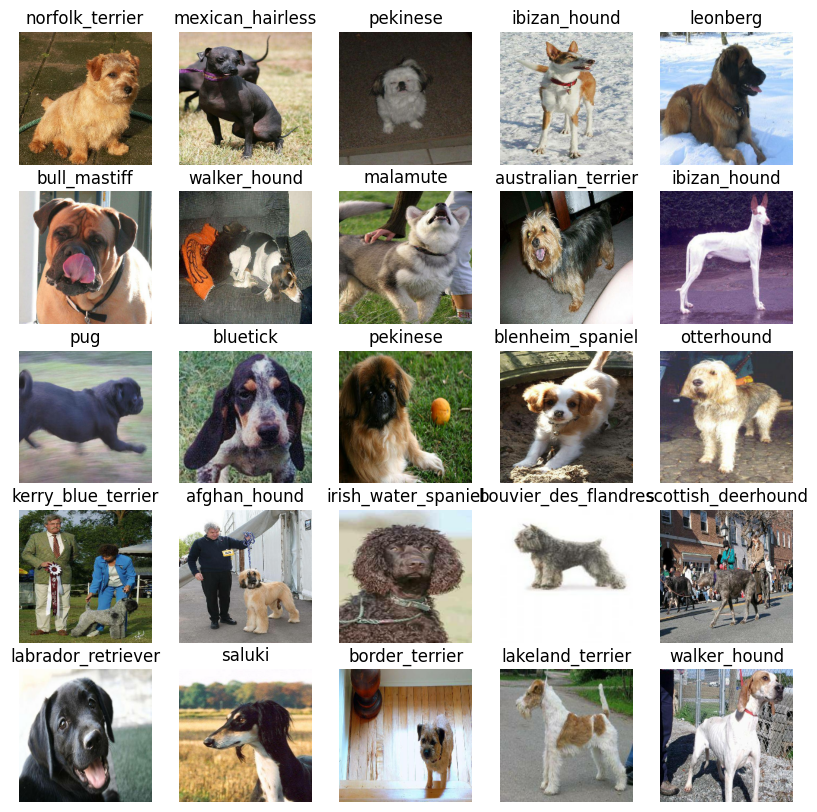

In [ ]:
# Now let's visualize the data in a training batch
show_25_images(train_images, train_labels)

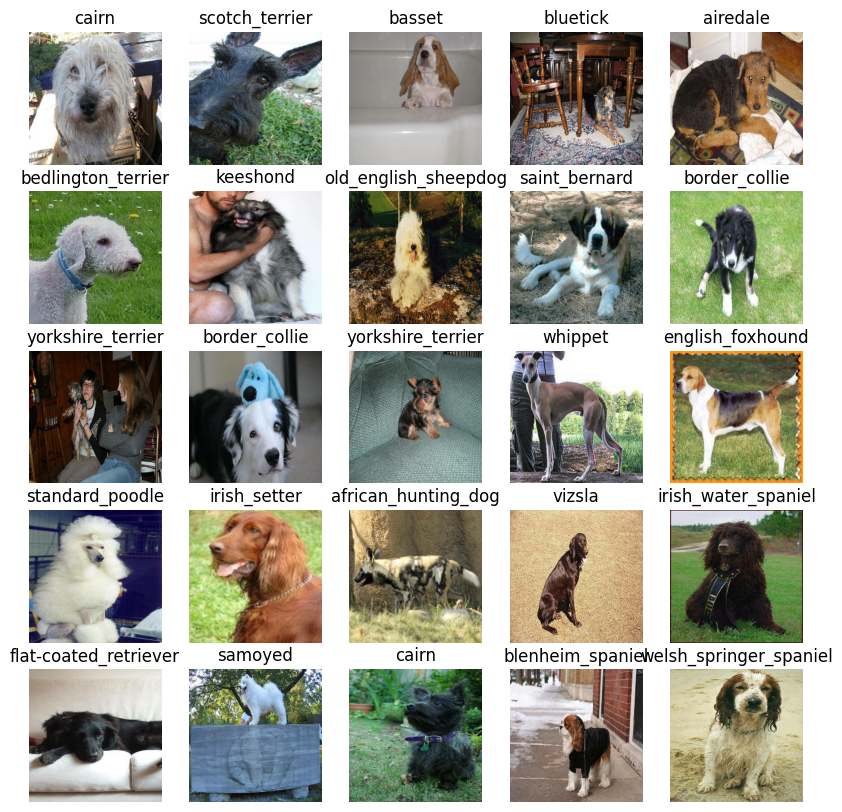

In [ ]:
# Now let's visualize our validation set
val_images, val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images, val_labels)

In [ ]:
# (tf.io.read_file(tf.constant(filenames[0]))) == (tf.io.read_file((filenames[0])))

## Building a model

Before we build a model, there are  few things we need to define:
* The input shape (our images shape, in the form of Tensors) to our model.
* the output shape (image labels, in the form of Tensors) of our model.
* The URL of the model we want to use. (https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5)

In [ ]:
IMG_SIZE

224

In [ ]:
# Setup input shape to the model
INPUT_SHAPE = [None, IMG_SIZE, IMG_SIZE, 3]  # batch, height, width, colour channels

# Setup output shape of our model
OUTPUT_SHAPE = len(unique_breeds)

# Setup model URL from TensorFlow Hub
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5"

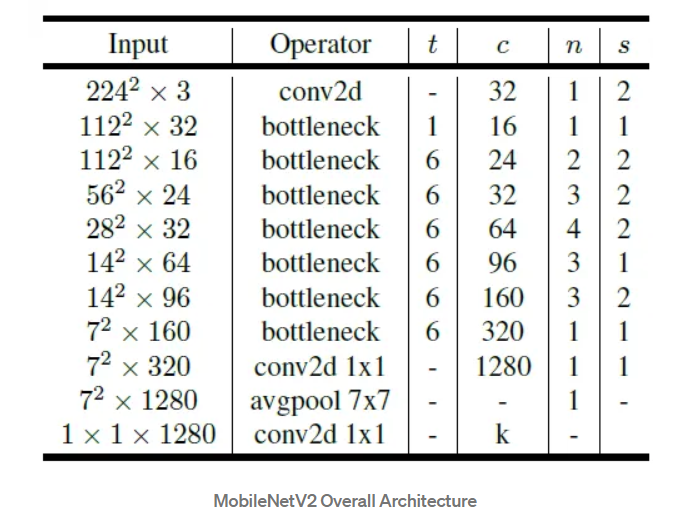

Now we've got our inputs, outputs and model ready to go.

Let's put them together into a Keras deep learning model!

Knowing this, let's create a function which:

* Takes the input shape, output shape and the model we've chosen as parameter.
*  Defines the layer in a Keras model in sequential fashion (do this first, then this, then that).
* Compiles the model (says it should be evaluated and improved).
* Builds the model (tells the model the input shape it'll be getting).
* Returns the model.

In [ ]:
# Create a function which builds a keras model
def create_model(input_shape=INPUT_SHAPE, output_shape=OUTPUT_SHAPE, model_url=MODEL_URL):
  print("Building model with:", model_url)

  # Setup the model layers
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), # Layer 1 (input layer)
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,
                                                activation="softmax") # Layer 2(output layer)
  ])

  # Compile the model
  model.compile(
      loss=tf.keras.losses.CategoricalCrossentropy(),
      optimizer=tf.keras.optimizers.Adam(),
      metrics=["accuracy"]
  )

  # Builds the model
  model.build(input_shape)

  return model



In [ ]:
model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5,552,953
Trainable params: 120,240
Non-trainable params: 5,432,713
_________________________________________________________________


In [ ]:
outputs = np.ones(shape=(1,1,1280))
outputs

array([[[1., 1., 1., ..., 1., 1., 1.]]])

## Creating callbacks

Callbacks are helper functions a model can use during training to do such things as save its progress, check its progress or stop training early if a model stops if a model stops improving.

We'll create two callbacks, one for TensorBoard (like Dashboard) which helps track our models progress and another for early stopping  which prevents our model training for too long.

### TensorBoard Callback

To setup a TensorBoard callbac, we need to do 3 things:
1. Load the TensorBoard notebook extension
2. Create a TensorBoard callback which is able to save logs to a directory and pass it our model's `fit()` function.
3. Visualize our models training logs with the `%tensorboard` magic function (we'll do this after model training).


In [ ]:
# Load TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
import datetime

# Create a function to build a TensorBoard callback

def create_tensorboard_callback():
  # Create a log directory for storing TensorBoard logs
  logdir = os.path.join("drive/My Drive/Dog Vision/logs",
                                          # Make it so the logs get tracked whenever we run an experiment
                                           datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

### Early Stopping Callback

Early stopping helps stop our model from overfitting by stopping training if a certain evaluation metric stops improving.

In [ ]:
# Create early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",
                                                                                                patience=3)

## Training a model (on subset of data)

Our first model is only going to train on 1000 images, to make sure everything is working.

In [ ]:
NUM_EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [ ]:
# Check to make sure we're still running on  a GPU
print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

GPU available


Let's create a function which trains a model.

* Create a model using `create_model`
* Setup a TensorBoard callback using `create_tensorboard_callback`
* Call the `fit()` function on our model passing it the training data, validation data, number of epochs to train for (`NUM_EPOCHS`) and the callback we'd like to use
* Return the model

In [ ]:
# Build a function to train and return a trained model

def train_model():
  """
  Trains a model and returns the trained versions.
  """

  # Create a model
  model = create_model()

  # Create new TensorBoard session everytime we train a model
  tensorboard   = create_tensorboard_callback()

  # Fit the model to the data passing it the callbacks we created
  model.fit(x=train_data,
                     epochs = NUM_EPOCHS,
                     validation_data=val_data,
                     validation_freq=1,
                     callbacks=[tensorboard, early_stopping])

  # Return the fitted model
  return model

In [ ]:
# Fit the model to the data
model = train_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5
Epoch 1/100
25/25 [==============================] - 153s 5s/step - loss: 4.6651 - accuracy: 0.0925 - val_loss: 3.4551 - val_accuracy: 0.2300
Epoch 2/100
25/25 [==============================] - 3s 113ms/step - loss: 1.6716 - accuracy: 0.6862 - val_loss: 2.2266 - val_accuracy: 0.4700
Epoch 3/100
25/25 [==============================] - 3s 125ms/step - loss: 0.5811 - accuracy: 0.9350 - val_loss: 1.7161 - val_accuracy: 0.5700
Epoch 4/100
25/25 [==============================] - 3s 124ms/step - loss: 0.2602 - accuracy: 0.9850 - val_loss: 1.5387 - val_accuracy: 0.5900
Epoch 5/100
25/25 [==============================] - 3s 118ms/step - loss: 0.1472 - accuracy: 0.9962 - val_loss: 1.4680 - val_accuracy: 0.6150
Epoch 6/100
25/25 [==============================] - 5s 183ms/step - loss: 0.1019 - accuracy: 0.9987 - val_loss: 1.4246 - val_accuracy: 0.6250
Epoch 7/100
25/25 [==============================]

**Question:** It looks like our model is overfitting because it's performing far better on the training dataset than the validation dataset, what are some ways to prevent model overfitting in deep learning neural networks?

**Note:** Overfitting to begins with is a good thing! It means our model is learning!!!

### Checking the TensorBoard Logs

The TensorBoard magic function (`%tensorboard`) will access the logs directory we created earlier and visualize its contents.

In [ ]:
%tensorboard --logdir drive/My\ Drive/Dog\ Vision/logs

<IPython.core.display.Javascript object>

## Making and evaluating predictions using a trained model

In [ ]:
# Make predictions on the validation data (not used to train on)

predictions = model.predict(val_data, verbose=1)
predictions

7/7 [==============================] - 3s 92ms/step


array([[8.62706336e-04, 9.48630404e-05, 2.48708675e-04, ...,
        4.88151767e-04, 3.97638723e-05, 1.77281839e-03],
       [1.29827382e-02, 2.54614046e-03, 1.16601717e-02, ...,
        2.31539062e-03, 7.49321189e-03, 4.06052015e-04],
       [5.82263829e-06, 2.22899089e-05, 1.67480121e-05, ...,
        7.56216177e-05, 5.76455532e-05, 7.15420319e-05],
       ...,
       [8.94003108e-07, 1.36142116e-04, 7.33438428e-05, ...,
        1.26075665e-05, 5.95866222e-05, 5.17562294e-05],
       [7.15703424e-03, 1.12442700e-04, 5.17356384e-04, ...,
        4.88784171e-05, 8.25614625e-05, 4.50172126e-02],
       [2.56531930e-04, 7.96594031e-05, 4.58364433e-04, ...,
        1.53506931e-03, 5.97869803e-04, 1.26454601e-04]], dtype=float32)

In [ ]:
predictions.shape

(200, 120)

In [ ]:
len(y_val)

200

In [ ]:
len(unique_breeds)

120

In [ ]:
len(predictions[0])

120

In [ ]:
np.sum(predictions[0])

0.99999994

In [ ]:
# First prediction
index = 42
print(predictions[index])
print(f"Max value (probability of prediction): {np.max(predictions[index])}")
print(f"Sum: {np.sum(predictions[index])}")
print(f"Max index: {np.argmax(predictions[index])}")
print(f"Predicted label: {unique_breeds[np.argmax(predictions[index])]}")

[5.8591373e-05 3.3439105e-04 1.5272388e-04 5.0808503e-05 2.5578695e-03
 5.5168148e-05 2.9872140e-04 1.1069466e-03 5.7541307e-02 1.9909130e-02
 8.2563754e-05 6.8381105e-06 6.2405271e-04 7.9173259e-03 3.7272132e-04
 2.6912813e-03 4.6892837e-06 1.0379312e-03 1.0635279e-04 4.9236510e-04
 8.4450903e-06 7.5015234e-04 1.9711892e-04 3.2477430e-05 2.2074892e-03
 2.8108241e-05 5.3744370e-05 2.1958539e-04 9.5973577e-05 6.2795858e-05
 2.6366220e-05 6.1285638e-05 1.7625782e-04 3.4427903e-05 1.6282454e-05
 2.6502174e-05 1.5157454e-03 3.4232627e-04 1.5601987e-04 2.1064834e-01
 1.5440953e-04 1.5222404e-05 5.2353172e-03 5.6951529e-05 2.5008500e-04
 4.8784303e-05 4.3070107e-04 1.1443679e-03 3.9416936e-05 1.9475014e-04
 2.0378151e-04 7.5058173e-04 1.1264478e-03 5.2048527e-03 3.6919948e-06
 2.8125735e-04 3.4360139e-05 1.3765659e-04 8.4132145e-05 1.8674300e-05
 1.2877576e-04 1.9553632e-03 3.8808870e-05 8.4861320e-05 1.5093033e-04
 2.8445973e-04 2.3565499e-05 3.0785441e-04 1.3871084e-04 3.4528846e-05
 5.876

Having the above functionality is great but we want to be able to do it at scale.

And it would be even better if we could see the images the prediction is being made on!

**Note:** Prediction probabilities are also known as confidence levels.

In [ ]:
# Turn prediction probability into their respective label (easier to understand)
def get_pred_label(prediction_probabilities):
  """
  Turns an array of prediction probabilites into a label.
  """
  return unique_breeds[np.argmax(prediction_probabilities)]

In [ ]:
# Get a predicted labels based on an array of prediction probabilities

pred_label =  get_pred_label(predictions[42])
pred_label

'walker_hound'

In [ ]:
val_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

Now since our validation data is still in a batch dataset, we'll have to unbatchify it to make predictions on the validation images and then compare those predictions to the validation labels (truth labels).

In [ ]:
# Create a function to unbatch a batch dataset
def unbatchify(data):
  """
  Take a batched dataset of (image, label) Tensors returns separate array of images and labels.
  """
  images = []
  labels = []

  # Loop through unbatched data
  for image,label in data.unbatch().as_numpy_iterator():
    images.append(image)
    labels.append(unique_breeds[np.argmax(label)])

  return images, labels

In [ ]:
# Unbatchify the validation data
val_images, val_labels = unbatchify(val_data)

Now we've got ways to get:
* Prediction labels
* Validation labels (truth labels)
* Validation images

Let's make some function to make these all a bit more visualize.

We'll create a function which:
* Takes an array of prediction probabilities, an array pf truth labels and array of images and an integer.
* Convert the prediction probabilities to a predicted label.
* Plot the predicted label, its predicted probability, the truth label and the target image on a single plot.

In [ ]:
def plot_pred(prediction_probabilities, labels, images, n=1):
  """
  View the predicton, ground truth and image for sample n
  """
  pred_prob, true_label, image = prediction_probabilities[n], labels[n], images[n]

  # Get the pred level
  pred_label = get_pred_label(pred_prob)

  # Plot the image & remove ticks
  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  # Change the color of the title depending on if the prediction is right or wrong
  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  # Change plot title to be predicted, probabilty of prediction and truth label
  plt.title("{} {:2.0f}% {}".format(pred_label,
                                                               np.max(pred_prob)*100,
                                                               true_label),color=color)


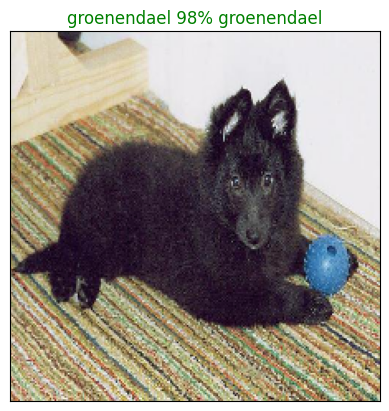

In [ ]:
plot_pred(prediction_probabilities=predictions,
                     labels = val_labels,
                     images = val_images,
                     n=77)

Now we've got one function to visualize our model top prediction, let's make another to view our models top 10 predictions.

This function will:
* Take an input of prediction probabilities array and a ground truth array and integer
* Find the predicted label using `get_pred_label()`
* Find the top 10:
   * Prediction probabilities indexes
   * Prediction probabilities values
   * Prediction labels
* Plot the top 10 prediction probability values and labels, coloring the true label green   



In [ ]:
def plot_pred_conf(prediction_probabilities, labels, n=1):
  """
  Plot the top 10 highest prediction confidences along with the truth label for sample n.
  """
  pred_prob, true_label = prediction_probabilities[n], labels[n]

  # Get the predicted label
  pred_label = get_pred_label(pred_prob)

  # Find the top 10 prediction confidence indexes
  top_10_pred_indexes = pred_prob.argsort()[-10:][::-1]
  # Find the top 10 prediction confidence values
  top_10_pred_values = pred_prob[top_10_pred_indexes]
  # Find the top 10 prediction labels
  top_10_pred_labels = unique_breeds[top_10_pred_indexes]

  # Setup plot
  top_plot = plt.bar(np.arange(len(top_10_pred_labels)),
                                      top_10_pred_values,
                                      color = "grey")
  plt.xticks(np.arange(len(top_10_pred_labels)),
             labels = top_10_pred_labels,
             rotation="vertical")
  # Change the color of true label
  if np.isin(true_label, top_10_pred_labels):
    top_plot[np.argmax(top_10_pred_labels == true_label)].set_color("green")
  else:
    pass

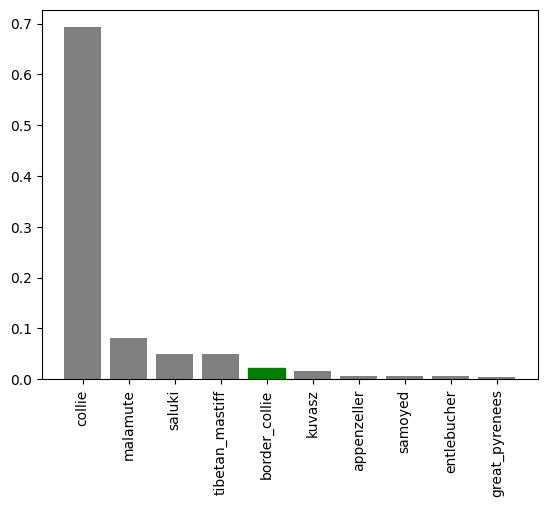

In [ ]:
plot_pred_conf(prediction_probabilities = predictions,
                                labels = val_labels,
                                n=9)

Now we've got some function to help us visualize our predictions and evaluate our model, let's check out a few.

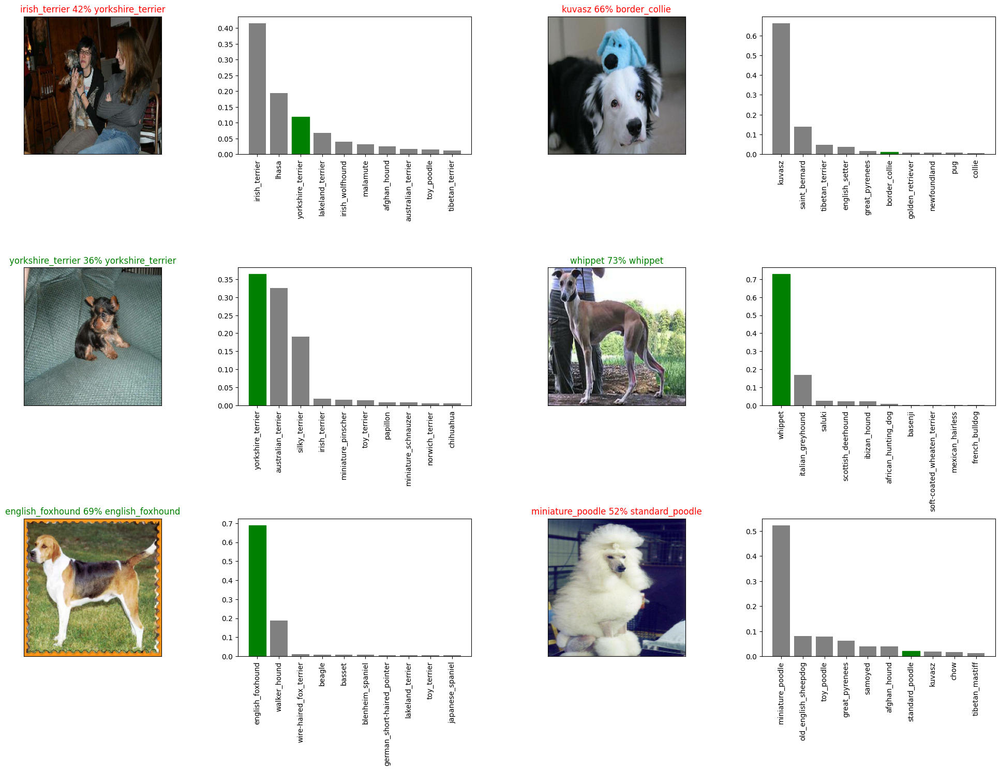

In [ ]:
# Let's check out a few predictions and their different values
i_multiplier = 10
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols, 5*num_rows))

for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities = predictions,
                       labels=val_labels,
                       images = val_images,
                      n = i+i_multiplier)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities= predictions,
                                  labels = val_labels,
                                  n =i+i_multiplier )

plt.tight_layout(h_pad=1.0)
plt.show()

## Saving and reloading a trained model


In [ ]:
# Create a function to save a model
def save_model(model, suffix=None):
  """
  Saves a given model in a models directory and appends a suffix (string).
  """
  # Create a model directory pathname with current time
  modeldir = os.path.join("drive/My Drive/Dog Vision/models",
                                                datetime.datetime.now().strftime("%Y%m%d-%H%M%s"))
  model_path = modeldir + "-" + suffix  + ".h5" # save format of model
  print(f"Saving model to : {model_path} ......")
  model.save(model_path)
  return model_path


In [ ]:
# Create a function to load a model
def load_model(model_path):
  """
  Loads a saved model from specified path.
  """
  print(f"Loading saved model from: {model_path}")
  model = tf.keras.models.load_model(model_path,
                                                                          custom_objects={'KerasLayer':hub.KerasLayer})
  return model

Now we've got functions to save and load a trained model, let's make sure they work!

In [ ]:
# Save our model trained on 1000 images
save_model(model, suffix="1000-images-mobilenetv2-Adam")

Saving model to : drive/My Drive/Dog Vision/models/20230627-13011687870911-1000-images-mobilenetv2-Adam.h5 ......


'drive/My Drive/Dog Vision/models/20230627-13011687870911-1000-images-mobilenetv2-Adam.h5'

In [ ]:
# Load a  trained model
loaded_1000_model = load_model("drive/My Drive/Dog Vision/models/20230627-13011687870911-1000-images-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20230627-13011687870911-1000-images-mobilenetv2-Adam.h5


In [ ]:
# Evaluate the pre-saved model
model.evaluate(val_data)

7/7 [==============================] - 1s 77ms/step - loss: 1.3256 - accuracy: 0.6500


[1.325628638267517, 0.6499999761581421]

In [ ]:
# Evaluate the loaded model
loaded_1000_model.evaluate(val_data)

7/7 [==============================] - 2s 104ms/step - loss: 1.3256 - accuracy: 0.6500


[1.325628638267517, 0.6499999761581421]

## Training a model (on full data)

In [ ]:
len(X), len(y)

(10222, 10222)

In [ ]:
X[:10]

['drive/MyDrive/Dog Vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
 'drive/MyDrive/Dog Vision/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
 'drive/MyDrive/Dog Vision/train/001cdf01b096e06d78e9e5112d419397.jpg',
 'drive/MyDrive/Dog Vision/train/00214f311d5d2247d5dfe4fe24b2303d.jpg',
 'drive/MyDrive/Dog Vision/train/0021f9ceb3235effd7fcde7f7538ed62.jpg',
 'drive/MyDrive/Dog Vision/train/002211c81b498ef88e1b40b9abf84e1d.jpg',
 'drive/MyDrive/Dog Vision/train/00290d3e1fdd27226ba27a8ce248ce85.jpg',
 'drive/MyDrive/Dog Vision/train/002a283a315af96eaea0e28e7163b21b.jpg',
 'drive/MyDrive/Dog Vision/train/003df8b8a8b05244b1d920bb6cf451f9.jpg',
 'drive/MyDrive/Dog Vision/train/0042188c895a2f14ef64a918ed9c7b64.jpg']

In [ ]:
len(X_train)

800

In [ ]:
y[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
# Create a data batch with the full data set
full_data = create_data_batches(X, y)

Creating training data batches....


In [ ]:
full_data

<_BatchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 120), dtype=tf.bool, name=None))>

In [ ]:
# Create a model for full model
full_model = create_model()

Building model with: https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/5


In [ ]:
# Create full model callbacks
full_model_tensorboard = create_tensorboard_callback()
# No validation set when training on all the data, so we can't monitor validation accuracy
full_model_early_stopping = tf.keras.callbacks.EarlyStopping(monitor="accuracy",
                                                                                                                         patience=3)

**Note:** Running the cell below will take a little while (may be upto 30 minutes for the first epoch) because the GPU we're using in the runtime has to load all of the images into memory.

In [ ]:
# Fit the full model to the full data
full_model.fit(x=full_data,
                            epochs = NUM_EPOCHS,
                            callbacks= [full_model_tensorboard, full_model_early_stopping])

Epoch 1/100
320/320 [==============================] - 40s 111ms/step - loss: 1.3388 - accuracy: 0.6719
Epoch 2/100
320/320 [==============================] - 33s 103ms/step - loss: 0.4058 - accuracy: 0.8779
Epoch 3/100
320/320 [==============================] - 35s 108ms/step - loss: 0.2376 - accuracy: 0.9374
Epoch 4/100
320/320 [==============================] - 34s 106ms/step - loss: 0.1533 - accuracy: 0.9626
Epoch 5/100
320/320 [==============================] - 46s 142ms/step - loss: 0.1061 - accuracy: 0.9782
Epoch 6/100
320/320 [==============================] - 38s 118ms/step - loss: 0.0779 - accuracy: 0.9857
Epoch 7/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0601 - accuracy: 0.9901
Epoch 8/100
320/320 [==============================] - 34s 105ms/step - loss: 0.0461 - accuracy: 0.9944
Epoch 9/100
320/320 [==============================] - 33s 104ms/step - loss: 0.0364 - accuracy: 0.9965
Epoch 10/100
320/320 [==============================] - 33s 104m

In [ ]:
save_model(full_model, suffix="full-image-set-mobilenetv2-Adam")

Saving model to : drive/My Drive/Dog Vision/models/20230627-13331687872788-full-image-set-mobilenetv2-Adam.h5 ......


'drive/My Drive/Dog Vision/models/20230627-13331687872788-full-image-set-mobilenetv2-Adam.h5'

In [ ]:
# Load the full model
loaded_full_model = load_model("drive/My Drive/Dog Vision/models/20230627-13331687872788-full-image-set-mobilenetv2-Adam.h5")

Loading saved model from: drive/My Drive/Dog Vision/models/20230627-13331687872788-full-image-set-mobilenetv2-Adam.h5


## Making predictions on the test dataset
Since our model has been trained on images in the form of Tensor batches, to make predictions on the test data, we'll have to get it into the same format.

To make predictions on the test data, we'll:
* Get the test images filenames
* Convert the filenames into test data batches using `create_data_batches()` and setting the `test_data` parameter to `True`(since the test data doesn't have labels).
* Make a predictions array by passing the test batches to the `predict()` method called on our model.

In [ ]:
# Load test image filenames
test_path = "drive/MyDrive/Dog Vision/test/"
test_filenames = [test_path + fname for fname in os.listdir(test_path)]

In [ ]:
test_filenames[:10]

['drive/MyDrive/Dog Vision/test/e0072c3d9bee718b68ff1cf964a52536.jpg',
 'drive/MyDrive/Dog Vision/test/e6926a5046cd957245918c33985bcd62.jpg',
 'drive/MyDrive/Dog Vision/test/e73dc6a8f2d7c941f28c0a5298bc5bdc.jpg',
 'drive/MyDrive/Dog Vision/test/dd539ec1933bc47bc80b1447a26aef45.jpg',
 'drive/MyDrive/Dog Vision/test/e62be234fa4a073e375af9f724261378.jpg',
 'drive/MyDrive/Dog Vision/test/e721c3eec5951861bf3ed7f40ef8b091.jpg',
 'drive/MyDrive/Dog Vision/test/df4b040b13c5f514d215ba7c0813eaf8.jpg',
 'drive/MyDrive/Dog Vision/test/e1f25b73300a49b61a7690239fe37b38.jpg',
 'drive/MyDrive/Dog Vision/test/e2888231cedd08540816e629c0733922.jpg',
 'drive/MyDrive/Dog Vision/test/df621265607ba0285bd79705eb3541e0.jpg']

In [ ]:
len(test_filenames)

10357

In [ ]:
# Create test data batch
test_data = create_data_batches(test_filenames,test_data=True)

Creating test data batches...


In [ ]:
test_data

<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

**Note:** Calling `predict()` on our full model and passing it the test data batch will take a long time to run (about an ~1hr)

In [ ]:
# Make predictions on test data batch using the loaded full model
test_predictions = loaded_full_model.predict(test_data,
                                                                                         verbose=1)

324/324 [==============================] - 2199s 7s/step


In [ ]:
# Save predictions (Numpy Array) to csv file (for access later)
np.savetxt("drive/My Drive/Dog Vision/preds_array.csv", test_predictions, delimiter=",")

In [ ]:
# Load predictions (Numpy array) from csv file
test_preds = np.loadtxt("drive/My Drive/Dog Vision/preds_array.csv", delimiter=",")

In [ ]:
test_preds[:10]

array([[2.19267604e-10, 2.52050403e-09, 8.99697400e-11, ...,
        1.09372440e-05, 5.90919580e-09, 6.76036171e-10],
       [1.21119854e-07, 2.47010621e-06, 9.11570319e-10, ...,
        4.12632630e-08, 1.88662438e-04, 9.90736316e-06],
       [4.63538444e-11, 8.10505395e-12, 3.79764274e-14, ...,
        7.06428468e-01, 2.75417633e-10, 3.64719106e-12],
       ...,
       [9.24209709e-10, 4.95296350e-13, 4.04065625e-09, ...,
        2.01700057e-09, 1.03650546e-10, 9.45110309e-12],
       [1.71663428e-09, 8.59418421e-08, 5.32768163e-10, ...,
        2.49969730e-07, 2.72443547e-04, 3.54584806e-10],
       [2.80042739e-10, 8.03474176e-10, 9.33865290e-13, ...,
        4.48273987e-11, 6.47730827e-11, 7.28786497e-13]])

In [ ]:
test_preds.shape

(10357, 120)

## Preparing test dataset predictions for kaggle

In [ ]:
# Create a pandas DataFrame with empty columns
preds_df = pd.DataFrame(columns=["id"] + list(unique_breeds))
preds_df.head().T

""
id
affenpinscher
afghan_hound
african_hunting_dog
airedale
...
welsh_springer_spaniel
west_highland_white_terrier
whippet
wire-haired_fox_terrier


In [ ]:
test_filenames

['drive/MyDrive/Dog Vision/test/e0072c3d9bee718b68ff1cf964a52536.jpg',
 'drive/MyDrive/Dog Vision/test/e6926a5046cd957245918c33985bcd62.jpg',
 'drive/MyDrive/Dog Vision/test/e73dc6a8f2d7c941f28c0a5298bc5bdc.jpg',
 'drive/MyDrive/Dog Vision/test/dd539ec1933bc47bc80b1447a26aef45.jpg',
 'drive/MyDrive/Dog Vision/test/e62be234fa4a073e375af9f724261378.jpg',
 'drive/MyDrive/Dog Vision/test/e721c3eec5951861bf3ed7f40ef8b091.jpg',
 'drive/MyDrive/Dog Vision/test/df4b040b13c5f514d215ba7c0813eaf8.jpg',
 'drive/MyDrive/Dog Vision/test/e1f25b73300a49b61a7690239fe37b38.jpg',
 'drive/MyDrive/Dog Vision/test/e2888231cedd08540816e629c0733922.jpg',
 'drive/MyDrive/Dog Vision/test/df621265607ba0285bd79705eb3541e0.jpg',
 'drive/MyDrive/Dog Vision/test/e7b608110b0e29120d8740f37e85f3d0.jpg',
 'drive/MyDrive/Dog Vision/test/f4270652c14534bd1916311b24261b83.jpg',
 'drive/MyDrive/Dog Vision/test/f51f6aeea8a23b6bd62728fde8f04ad8.jpg',
 'drive/MyDrive/Dog Vision/test/efc4b489fc15ff97a50536c71029a8b1.jpg',
 'driv

In [ ]:
# Append test image ID's to predictions DataFrame
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids

['e0072c3d9bee718b68ff1cf964a52536',
 'e6926a5046cd957245918c33985bcd62',
 'e73dc6a8f2d7c941f28c0a5298bc5bdc',
 'dd539ec1933bc47bc80b1447a26aef45',
 'e62be234fa4a073e375af9f724261378',
 'e721c3eec5951861bf3ed7f40ef8b091',
 'df4b040b13c5f514d215ba7c0813eaf8',
 'e1f25b73300a49b61a7690239fe37b38',
 'e2888231cedd08540816e629c0733922',
 'df621265607ba0285bd79705eb3541e0',
 'e7b608110b0e29120d8740f37e85f3d0',
 'f4270652c14534bd1916311b24261b83',
 'f51f6aeea8a23b6bd62728fde8f04ad8',
 'efc4b489fc15ff97a50536c71029a8b1',
 'f58b1ce36c59e42dd22be92949fc38a7',
 'f586cdd98e69c6909b8048d728937ab9',
 'ef9432cc6dc7ab7ba38d18abffe6d1a0',
 'f3535f627d9d45218bd401ec24e250ac',
 'e9999f6b9a052810df4a5a762cb4cd1e',
 'f3d0cbdba1dab4f22ab5510723dd969a',
 'ef9de7d5f286c09daf1807e2ae67c98d',
 'f24c3d9735880ef6ea736dc549419771',
 'f282ea683674bf3bde3715cb018b1c26',
 'f1dcabbeb1dbebb326a4b029b6f8b188',
 'ed63374c99282b3081705ed84a2b93bc',
 'ead8c0e74fb7ddcf05a6395ee06fa9aa',
 'ec8bf9fd1bae9c6cc54b996425538a5c',
 

In [ ]:
preds_df["id"] = test_ids

In [ ]:
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0072c3d9bee718b68ff1cf964a52536,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e6926a5046cd957245918c33985bcd62,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e73dc6a8f2d7c941f28c0a5298bc5bdc,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,dd539ec1933bc47bc80b1447a26aef45,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e62be234fa4a073e375af9f724261378,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
# Add the predictio probabilities to each dog breed column
preds_df[list(unique_breeds)] = test_predictions
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e0072c3d9bee718b68ff1cf964a52536,2.192676e-10,2.520504e-09,8.996974e-11,8.066163e-10,1.992499e-09,1.084267e-07,3.156960e-10,6.669076e-09,3.811382e-04,...,5.093102e-09,1.091211e-04,4.073833e-05,2.676761e-03,7.647319e-08,2.139633e-10,2.261386e-10,1.093724e-05,5.909196e-09,6.760362e-10
1,e6926a5046cd957245918c33985bcd62,1.211199e-07,2.470106e-06,9.115703e-10,2.188894e-06,2.772851e-06,1.574065e-08,9.231785e-09,4.175300e-08,7.806464e-10,...,2.258381e-02,1.533118e-07,1.024505e-05,4.649082e-07,1.923139e-06,1.030851e-08,3.337333e-08,4.126326e-08,1.886624e-04,9.907363e-06
2,e73dc6a8f2d7c941f28c0a5298bc5bdc,4.635384e-11,8.105054e-12,3.797643e-14,9.252096e-12,8.474817e-04,4.501461e-02,4.764436e-11,1.232854e-05,7.328664e-12,...,1.493729e-09,1.002890e-09,2.080913e-10,1.445794e-08,3.326627e-07,2.209667e-11,7.873378e-11,7.064285e-01,2.754176e-10,3.647191e-12
3,dd539ec1933bc47bc80b1447a26aef45,1.538727e-06,7.759179e-09,1.680331e-08,2.073908e-11,3.687561e-06,1.227666e-09,8.846063e-05,1.899884e-07,6.743311e-07,...,1.402977e-07,3.155671e-09,1.731488e-09,9.282099e-06,1.569090e-08,3.365076e-08,5.152217e-03,6.917013e-08,4.001146e-08,4.043431e-07
4,e62be234fa4a073e375af9f724261378,3.170441e-09,1.068059e-09,1.790288e-07,1.290179e-08,3.878675e-07,4.273296e-06,1.852461e-04,3.250314e-03,2.289871e-06,...,3.098567e-10,3.445709e-03,9.266223e-10,1.599343e-05,3.440023e-09,1.245700e-05,2.356400e-08,6.925024e-05,1.864046e-03,1.575710e-08


In [ ]:
# Export predictions csv
preds_df.to_csv("drive/My Drive/Dog Vision/full_model_predictions_submission_1_mobilenetv2.csv",index=False)

## Making predictions on custom images

To make predictions on custom images
* Get the filepaths of our own images.
* Turn the filepaths into data batches using `create_data_batches()` and since our custom images won't have labels, we set the `test_data` parameter to `True`.
* Pass the custom image data batch to our model's `predict()` method.
* Convert the prediction output probabilities to prediction label.
* Compare the predicted label to the custom images.

In [ ]:
# Get custom images filepaths
custom_path = "drive/MyDrive/Dog Vision/my-dog-photos/"
custom_image_paths = [custom_path + fname for fname in os.listdir(custom_path)]


In [ ]:
custom_image_paths

['drive/MyDrive/Dog Vision/my-dog-photos/d3.jpg']

In [ ]:
# Turn custom images into batch dataset
custom_data = create_data_batches(custom_image_paths,test_data=True)
custom_data

Creating test data batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [ ]:
# Making predictions
custom_preds = loaded_full_model.predict(custom_data)

1/1 [==============================] - 1s 538ms/step


In [ ]:
custom_preds.shape

(1, 120)

In [ ]:
# Get custom image predictions labels
custom_preds_label = [get_pred_label(custom_preds[i]) for i in range(len(custom_preds))]

In [ ]:
custom_preds_label

['schipperke']

In [ ]:
# Get the custom images
custom_images = []

# Loop through unbatched data
for image in custom_data.unbatch().as_numpy_iterator():
  custom_images.append(image)


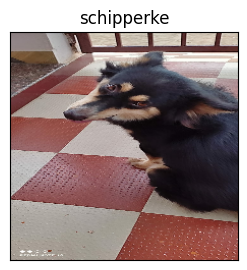

In [ ]:
# Check custom image predictions
plt.figure(figsize=(10,10))
for i, image in enumerate(custom_images):
  plt.subplot(1,3,i+1)
  plt.xticks([])
  plt.yticks([])
  plt.title(custom_preds_label[i])
  plt.imshow(image)
